<a href="https://colab.research.google.com/github/bimamj/PCVK_2026/blob/main/Modul2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

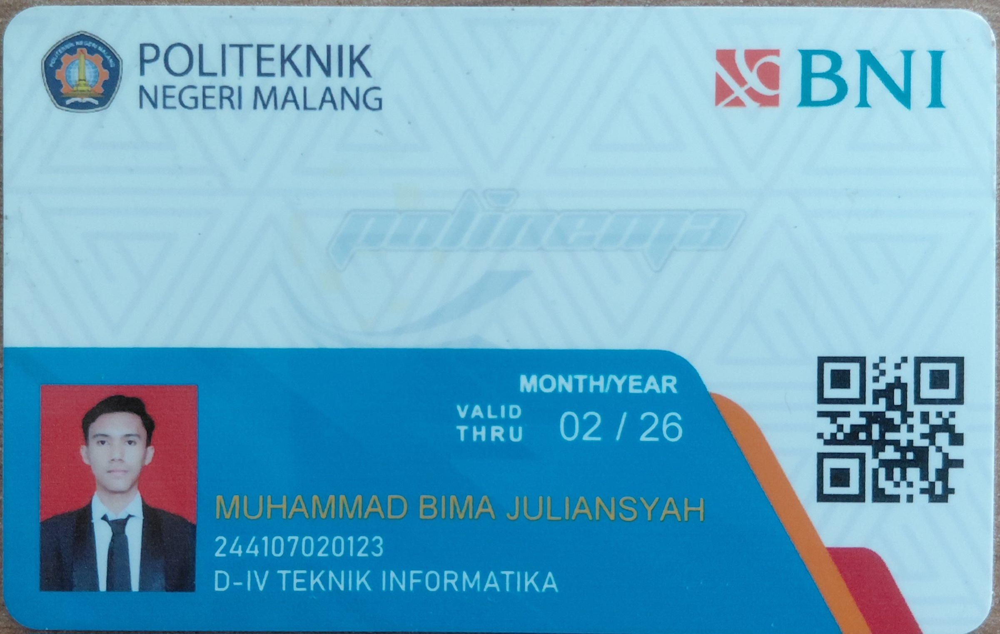

Resolusi Gambar:  2401  x  1523


In [1]:
import cv2
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv2.imread('/content/drive/MyDrive/PCVK/Ktm bima.jpg')
cv2_imshow(img)

print("Resolusi Gambar: ", img.shape[1], " x ", img.shape[0])

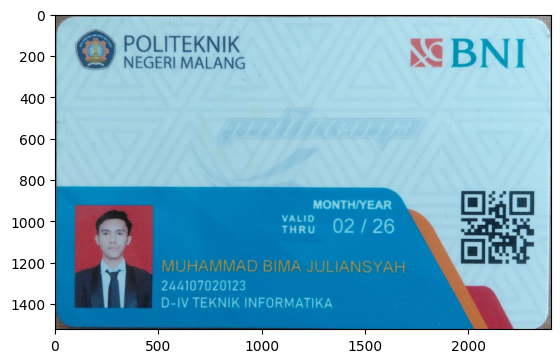

In [3]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Ktm bima.jpg')
# plt.imshow(img) # BGR
img2= cv2.cvtColor(img,cv2.COLOR_BGR2RGB) #BGR to RGB
plt.imshow(img2)

Text(0.5, 1.0, 'With cmap')

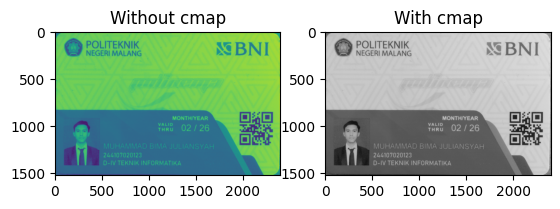

In [6]:
img_gray = cv2.imread('/content/drive/MyDrive/PCVK/Ktm bima.jpg', cv2.IMREAD_GRAYSCALE)

#tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title("Without cmap")

#pake cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title("With cmap")

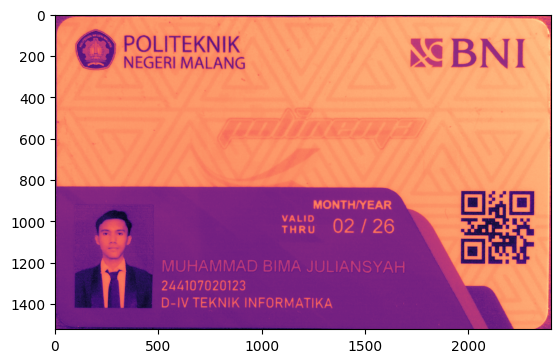

In [7]:
plt.imshow(img_gray, cmap='magma')

## Practicum Answers

1.


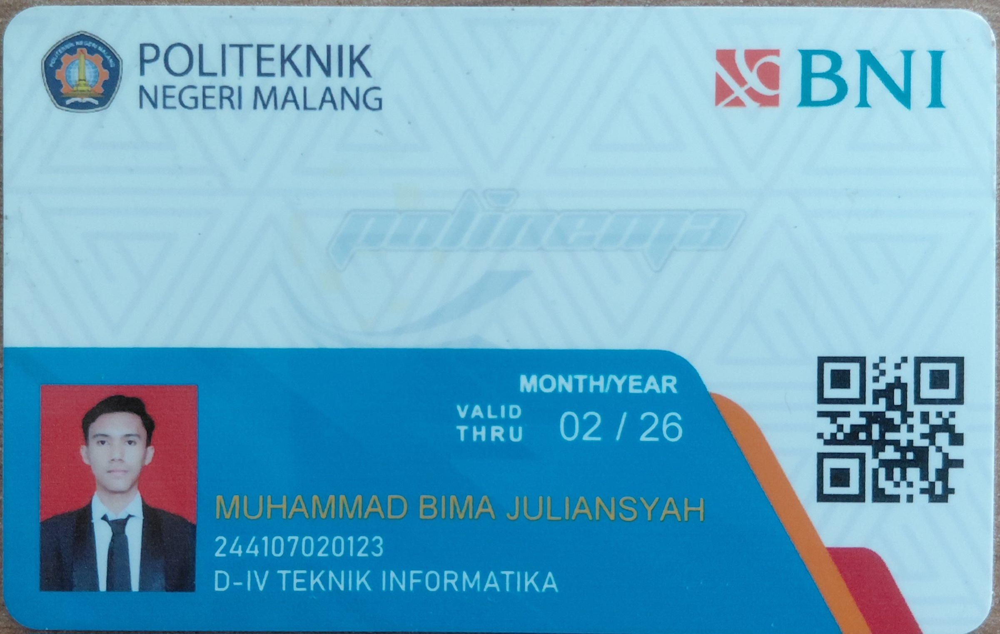

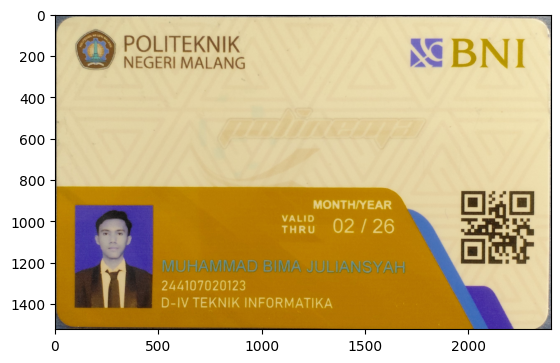

Pixel value: [220 207 161]


In [8]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Ktm bima.jpg')
cv2_imshow(img)
plt.imshow(img)
plt.show()

print("Pixel value:", img[100, 100])

2. The difference is that int32 can store bigger range than int16
3. It is used so that we can see the output on our notebook from the imported cv2_imshow OpenCV
4. Both display image with the same RGB channer order, so the image shown is the real color. The difference is that `skimage.io.imread()` read it using RGB order, while `cv2.imread()` read the image in BGR order
5. Changing figsize doesn't influence the value of img.shape

## Practicum Task - Application

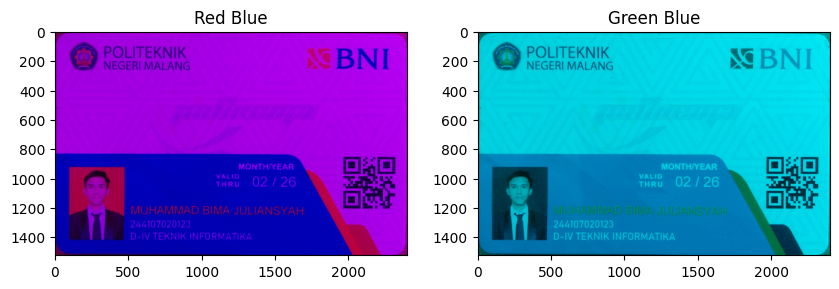

In [9]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Ktm bima.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_RB = img_rgb.copy()
img_RB[:, :, 1] = 0

img_GB = img_rgb.copy()
img_GB[:, :, 0] = 0

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_RB)
plt.title('Red Blue')

plt.subplot(1, 2, 2)
plt.imshow(img_GB)
plt.title('Green Blue')
plt.show()

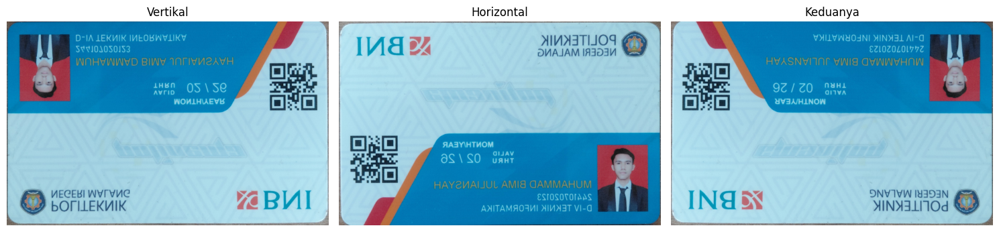

In [10]:
img_vertikal = cv2.flip(img_rgb, 0)
img_horizontal = cv2.flip(img_rgb, 1)
img_both = cv2.flip(img_rgb, -1)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(img_vertikal)
axes[0].set_title("Vertikal")
axes[0].axis("off")

axes[1].imshow(img_horizontal)
axes[1].set_title("Horizontal")
axes[1].axis("off")

axes[2].imshow(img_both)
axes[2].set_title("Both")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [11]:
red_channel = img_rgb[:, :, 0]
avg_red = np.mean(red_channel)

print(f"Average Red Channel Intensity: {avg_red:.2f}")

Average Red Channel Intensity: 111.36


## Practicum Assignment
---
### Study Case 1

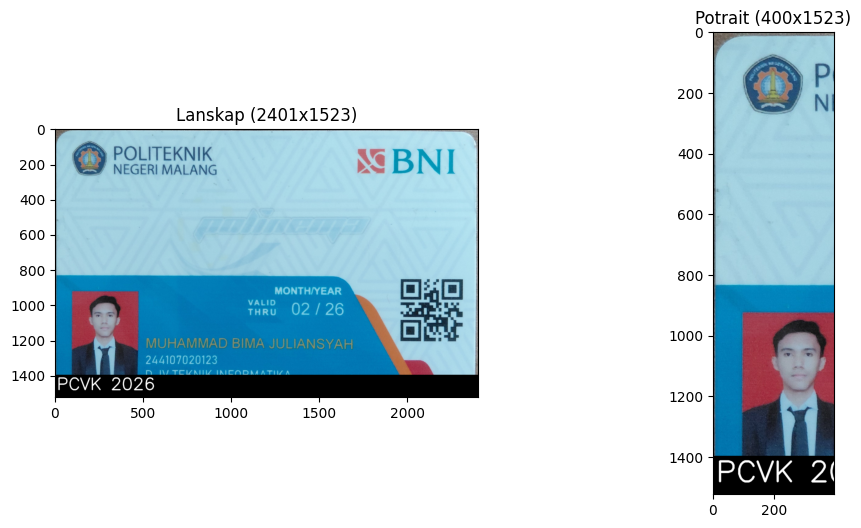

In [15]:
def add_label(img_bgr, teks):
    h, w = img_bgr.shape[:2]
    tinggi_bar = h // 12
    canvas = img_bgr.copy()
    canvas[h - tinggi_bar:h, 0:w] = (0, 0, 0)

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = tinggi_bar / 40
    thickness = max(1, tinggi_bar // 25)
    org = (10, h - tinggi_bar // 3)

    cv2.putText(canvas, teks, org, font, font_scale, (255, 255, 255),
               thickness, lineType=cv2.LINE_AA)
    return canvas


img_landscape = cv2.imread('/content/drive/MyDrive/PCVK/Ktm bima.jpg')
img_potrait = img_landscape[:, 0:400].copy()

hasil1 = add_label(img_landscape, 'PCVK 2026')
hasil2 = add_label(img_potrait, 'PCVK 2026')

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(hasil1, cv2.COLOR_BGR2RGB))
plt.title(f'Lanskap ({img_landscape.shape[1]}x{img_landscape.shape[0]})')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(hasil2, cv2.COLOR_BGR2RGB))
plt.title(f'Potrait ({img_potrait.shape[1]}x{img_potrait.shape[0]})')

plt.show()

---
## Study Case 2

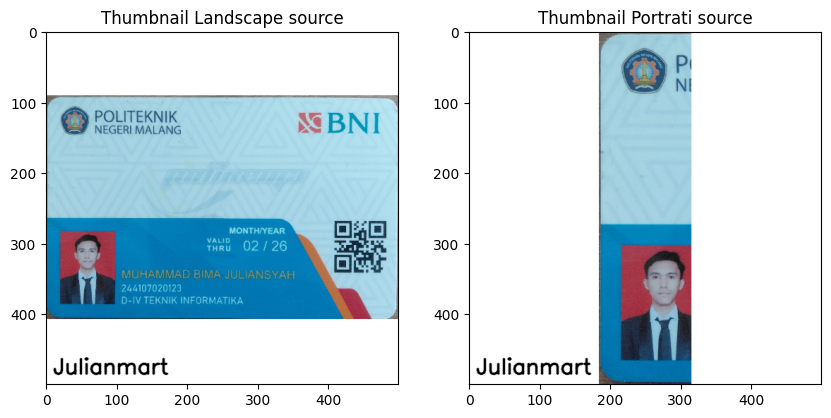

In [16]:
def add_thumbnail_square(img_bgr, size=500, bg_color=(255, 255, 255), store_name='Julianmart'):
    h, w = img_bgr.shape[:2]
    scale = size / max(h, w)
    w_new, h_new = int(w * scale), int(h * scale)
    img_resize = cv2.resize(img_bgr, (w_new, h_new))
    canvas = np.full((size, size, 3), bg_color, dtype=np.uint8)

    x_offset = (size - w_new) // 2
    y_offset = (size - h_new) // 2
    canvas[y_offset:y_offset + h_new, x_offset:x_offset + w_new] = img_resize
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = size / 500
    thickness = max(1, size // 250)
    cv2.putText(canvas, store_name, (10, size - 15), font, font_scale,
               (0, 0, 0), thickness, lineType=cv2.LINE_AA)

    return canvas

thumb1 = add_thumbnail_square(img_landscape)
thumb2 = add_thumbnail_square(img_potrait)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(thumb1, cv2.COLOR_BGR2RGB))
plt.title('Thumbnail Landscape source')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(thumb2, cv2.COLOR_BGR2RGB))
plt.title('Thumbnail Portrati source')
plt.show()